In [12]:
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread
from skimage import color, filters, morphology

plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['image.cmap'] = 'gray'


Loaded: test.tiff
Raw shape=(3850, 5762, 3), dtype=uint16
L range: 1.833 .. 99.999
a range: -76.723 .. 78.699
b range: -106.567 .. 73.449


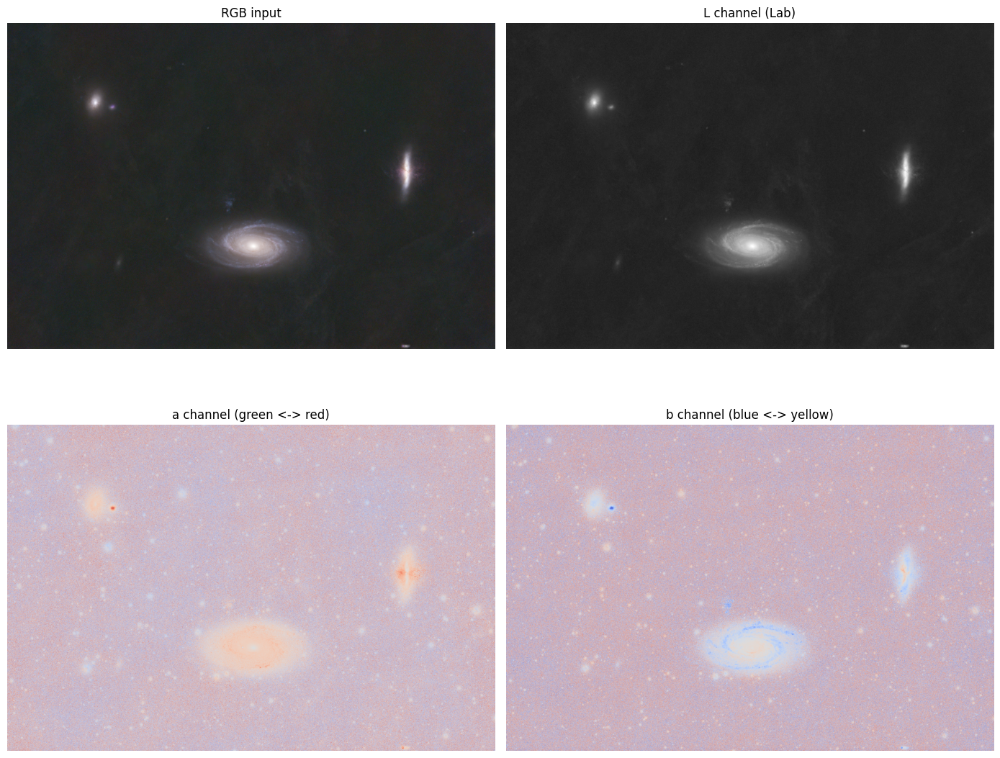

In [13]:
# Step 1: RGB -> Lab; L as luminance proxy, a/b as color deviations
tiff_candidates = sorted(Path('.').glob('*.tif*'))
if not tiff_candidates:
    raise FileNotFoundError('No TIFF files found in current directory')

preferred = [p for p in tiff_candidates if 'starless' in p.name.lower()]
img_path = preferred[0] if preferred else tiff_candidates[0]
rgb = imread(img_path)
print(f'Loaded: {img_path}')
print(f'Raw shape={rgb.shape}, dtype={rgb.dtype}')

if rgb.ndim == 2:
    rgb = np.stack([rgb, rgb, rgb], axis=-1)
    print('Converted grayscale TIFF to 3-channel RGB proxy')
elif rgb.ndim == 3 and rgb.shape[-1] > 3:
    rgb = rgb[..., :3]
    print('Dropped extra channels, kept first 3 as RGB')

if np.issubdtype(rgb.dtype, np.integer):
    rgb_float = rgb.astype(np.float32) / np.iinfo(rgb.dtype).max
else:
    rgb_float = rgb.astype(np.float32)
    if rgb_float.max() > 1.0:
        rgb_float /= rgb_float.max()

rgb_float = np.clip(np.nan_to_num(rgb_float, nan=0.0, posinf=1.0, neginf=0.0), 0.0, 1.0)
lab = color.rgb2lab(rgb_float)
L, a, b = lab[..., 0], lab[..., 1], lab[..., 2]

print(f'L range: {L.min():.3f} .. {L.max():.3f}')
print(f'a range: {a.min():.3f} .. {a.max():.3f}')
print(f'b range: {b.min():.3f} .. {b.max():.3f}')

a_lim = np.percentile(np.abs(a), 99)
b_lim = np.percentile(np.abs(b), 99)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes[0, 0].imshow(np.clip(rgb_float, 0, 1))
axes[0, 0].set_title('RGB input')
axes[0, 0].axis('off')

axes[0, 1].imshow(L, cmap='gray')
axes[0, 1].set_title('L channel (Lab)')
axes[0, 1].axis('off')

axes[1, 0].imshow(a, cmap='coolwarm', vmin=-a_lim, vmax=a_lim)
axes[1, 0].set_title('a channel (green <-> red)')
axes[1, 0].axis('off')

axes[1, 1].imshow(b, cmap='coolwarm', vmin=-b_lim, vmax=b_lim)
axes[1, 1].set_title('b channel (blue <-> yellow)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


/var/folders/6v/mtnpf5g166lbvp24vscc7x0c0000gn/T/ipykernel_63677/1047037338.py:23: FutureWarning: Parameter `min_size` is deprecated since version 0.26.0 and will be removed in 2.0.0 (or later). To avoid this warning, please use the parameter `max_size` instead. For more details, see the documentation of `remove_small_objects`. Note that the new threshold removes objects smaller than **or equal to** its value, while the previous parameter only removed smaller ones.
  foreground_seed = morphology.remove_small_objects(foreground_seed, min_size=128)
/var/folders/6v/mtnpf5g166lbvp24vscc7x0c0000gn/T/ipykernel_63677/1047037338.py:26: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  foreground_expanded = morphology.binary_dilation(foreground_seed, morphology.disk(dilate_radius))
/var/folders/6v/mtnpf5g166lbvp24vscc7x0

median(L)=0.1716, MAD=0.0521
bright_thresh=0.3538, dark_thresh=0.0000
contrast_thresh=0.1069, edge_thresh=0.1049
background pixels: 95.67%


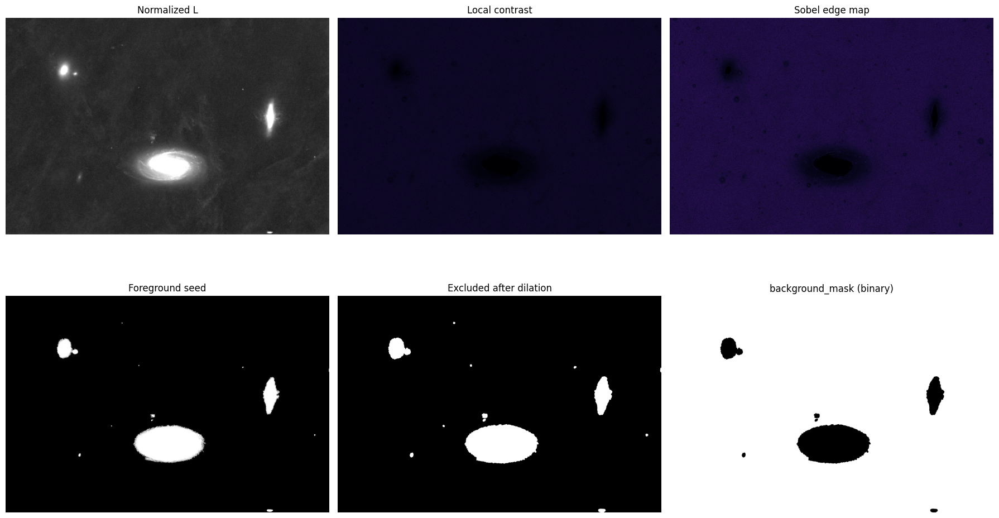

In [14]:
# Step 2: Build background mask for starless/stretched data
L_low, L_high = np.percentile(L, [1, 99])
L_norm = np.clip((L - L_low) / (L_high - L_low + 1e-8), 0.0, 1.0)

l_med = np.median(L_norm)
l_mad = np.median(np.abs(L_norm - l_med)) + 1e-6
bright_thresh = min(1.0, l_med + 3.5 * l_mad)
dark_thresh = max(0.0, l_med - 4.0 * l_mad)

local_base = filters.gaussian(L_norm, sigma=3, preserve_range=True)
local_contrast = np.abs(L_norm - local_base)
contrast_thresh = np.percentile(local_contrast, 88)

edge_map = filters.sobel(L_norm)
edge_thresh = np.percentile(edge_map, 90)

foreground_seed = (
    (L_norm > bright_thresh)
    | (L_norm < dark_thresh)
    | (local_contrast > contrast_thresh)
    | (edge_map > edge_thresh)
)
foreground_seed = morphology.remove_small_objects(foreground_seed, min_size=128)

dilate_radius = 10
foreground_expanded = morphology.binary_dilation(foreground_seed, morphology.disk(dilate_radius))
background_mask = ~foreground_expanded
background_mask = morphology.remove_small_objects(background_mask, min_size=512)
background_mask = morphology.remove_small_holes(background_mask, area_threshold=2048)

bg_ratio = background_mask.mean() * 100
print(f'median(L)={l_med:.4f}, MAD={l_mad:.4f}')
print(f'bright_thresh={bright_thresh:.4f}, dark_thresh={dark_thresh:.4f}')
print(f'contrast_thresh={contrast_thresh:.4f}, edge_thresh={edge_thresh:.4f}')
print(f'background pixels: {bg_ratio:.2f}%')

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes[0, 0].imshow(L_norm, cmap='gray')
axes[0, 0].set_title('Normalized L')
axes[0, 0].axis('off')

axes[0, 1].imshow(local_contrast, cmap='magma')
axes[0, 1].set_title('Local contrast')
axes[0, 1].axis('off')

axes[0, 2].imshow(edge_map, cmap='magma')
axes[0, 2].set_title('Sobel edge map')
axes[0, 2].axis('off')

axes[1, 0].imshow(foreground_seed, cmap='gray')
axes[1, 0].set_title('Foreground seed')
axes[1, 0].axis('off')

axes[1, 1].imshow(foreground_expanded, cmap='gray')
axes[1, 1].set_title('Excluded after dilation')
axes[1, 1].axis('off')

axes[1, 2].imshow(background_mask, cmap='gray')
axes[1, 2].set_title('background_mask (binary)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


Scale-space debug (background only):
  sigma= 8: std(a)=1.1871, std(b)=1.3382, p95(chroma)=3.5125
  sigma=16: std(a)=0.9557, std(b)=0.9806, p95(chroma)=2.8481
  sigma=32: std(a)=0.8435, std(b)=0.7923, p95(chroma)=2.5269
  sigma=64: std(a)=0.7719, std(b)=0.6798, p95(chroma)=2.3198


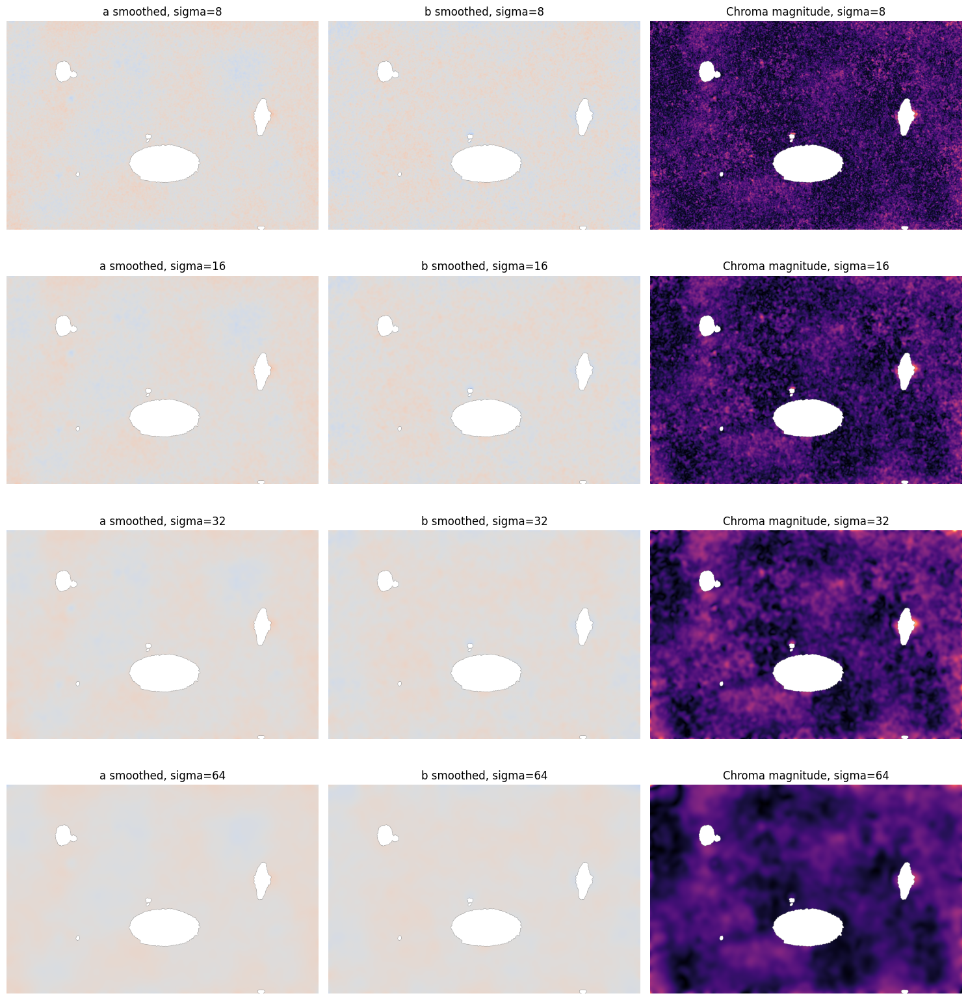

In [15]:
# Step 3: Remove high-frequency stuff; build scale-space on a/b channels
sigmas = [8, 16, 32, 64]
mask_f = background_mask.astype(np.float32)
eps = 1e-6

a_bg = np.where(background_mask, a, 0.0)
b_bg = np.where(background_mask, b, 0.0)

smoothed = {}
for s in sigmas:
    w = filters.gaussian(mask_f, sigma=s, preserve_range=True)
    a_s = filters.gaussian(a_bg, sigma=s, preserve_range=True) / (w + eps)
    b_s = filters.gaussian(b_bg, sigma=s, preserve_range=True) / (w + eps)
    c_s = np.sqrt(a_s**2 + b_s**2)
    smoothed[s] = (a_s, b_s, c_s)

print('Scale-space debug (background only):')
for s in sigmas:
    a_s, b_s, c_s = smoothed[s]
    a_std = np.std(a_s[background_mask])
    b_std = np.std(b_s[background_mask])
    c_p95 = np.percentile(c_s[background_mask], 95)
    print(f'  sigma={s:>2}: std(a)={a_std:.4f}, std(b)={b_std:.4f}, p95(chroma)={c_p95:.4f}')

a_lim = np.percentile(np.abs(a[background_mask]), 98)
b_lim = np.percentile(np.abs(b[background_mask]), 98)

fig, axes = plt.subplots(len(sigmas), 3, figsize=(15, 4 * len(sigmas)))
if len(sigmas) == 1:
    axes = np.expand_dims(axes, axis=0)

for i, s in enumerate(sigmas):
    a_s, b_s, c_s = smoothed[s]

    a_vis = np.where(background_mask, a_s, np.nan)
    b_vis = np.where(background_mask, b_s, np.nan)
    c_vis = np.where(background_mask, c_s, np.nan)

    axes[i, 0].imshow(a_vis, cmap='coolwarm', vmin=-a_lim, vmax=a_lim)
    axes[i, 0].set_title(f'a smoothed, sigma={s}')
    axes[i, 0].axis('off')

    axes[i, 1].imshow(b_vis, cmap='coolwarm', vmin=-b_lim, vmax=b_lim)
    axes[i, 1].set_title(f'b smoothed, sigma={s}')
    axes[i, 1].axis('off')

    axes[i, 2].imshow(c_vis, cmap='magma')
    axes[i, 2].set_title(f'Chroma magnitude, sigma={s}')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


sigma=32, rg_sign=+1
RG_map mean=0.8081, std=0.8435
BY_map mean=0.7403, std=0.7923


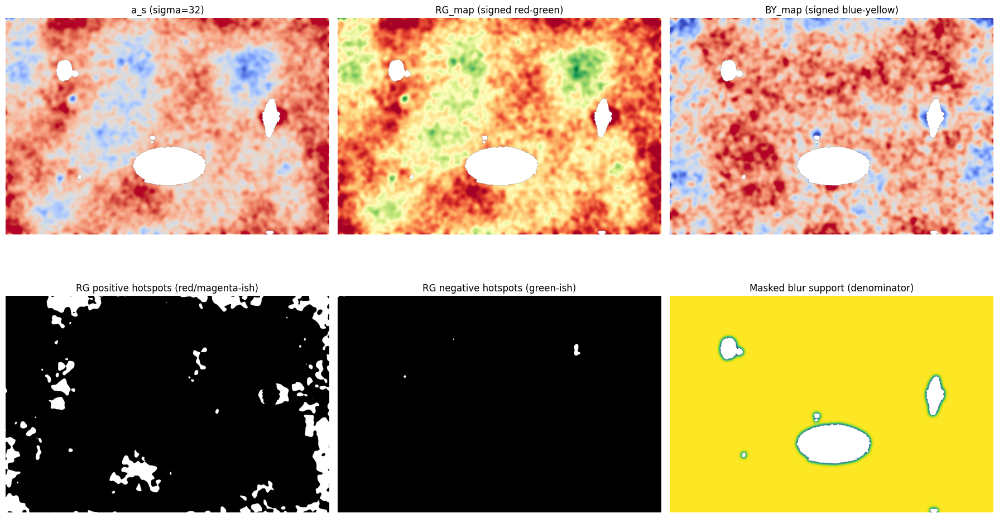

In [16]:
# Step 4: Target-scale signed maps with masked normalized blur
target_sigma = 32  # chosen from previous visual debug
eps = 1e-6

def masked_normalized_blur(x, mask, sigma, eps=1e-6):
    mask_f = mask.astype(np.float32)
    x_masked = np.where(mask, x, 0.0)
    num = filters.gaussian(x_masked, sigma=sigma, preserve_range=True)
    den = filters.gaussian(mask_f, sigma=sigma, preserve_range=True)
    y = num / (den + eps)
    return y, den

a_s, w_s = masked_normalized_blur(a, background_mask, target_sigma, eps=eps)
b_s, _ = masked_normalized_blur(b, background_mask, target_sigma, eps=eps)

# skimage.color.rgb2lab convention: +a=red/magenta, -a=green, +b=yellow, -b=blue
rg_sign = 1.0  # set -1.0 if you want inverse RG polarity
RG_map = rg_sign * a_s
BY_map = b_s

rg_mean = np.mean(RG_map[background_mask])
rg_std = np.std(RG_map[background_mask])
by_mean = np.mean(BY_map[background_mask])
by_std = np.std(BY_map[background_mask])
print(f'sigma={target_sigma}, rg_sign={rg_sign:+.0f}')
print(f'RG_map mean={rg_mean:.4f}, std={rg_std:.4f}')
print(f'BY_map mean={by_mean:.4f}, std={by_std:.4f}')

rg_lim = np.percentile(np.abs(RG_map[background_mask]), 98)
by_lim = np.percentile(np.abs(BY_map[background_mask]), 98)
rg_thr = np.percentile(np.abs(RG_map[background_mask]), 90)

rg_pos = RG_map > rg_thr
rg_neg = RG_map < -rg_thr

fig, axes = plt.subplots(2, 3, figsize=(18, 11))
axes[0, 0].imshow(np.where(background_mask, a_s, np.nan), cmap='coolwarm', vmin=-rg_lim, vmax=rg_lim)
axes[0, 0].set_title(f'a_s (sigma={target_sigma})')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, RG_map, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 1].set_title('RG_map (signed red-green)')
axes[0, 1].axis('off')

axes[0, 2].imshow(np.where(background_mask, BY_map, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[0, 2].set_title('BY_map (signed blue-yellow)')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.where(background_mask, rg_pos, False), cmap='gray')
axes[1, 0].set_title('RG positive hotspots (red/magenta-ish)')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.where(background_mask, rg_neg, False), cmap='gray')
axes[1, 1].set_title('RG negative hotspots (green-ish)')
axes[1, 1].axis('off')

axes[1, 2].imshow(np.where(background_mask, w_s, np.nan), cmap='viridis')
axes[1, 2].set_title('Masked blur support (denominator)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


RG robust center=0.8114, mad=0.5610
BY robust center=0.7892, mad=0.5028
RG dominant pixels: 49.25% of background


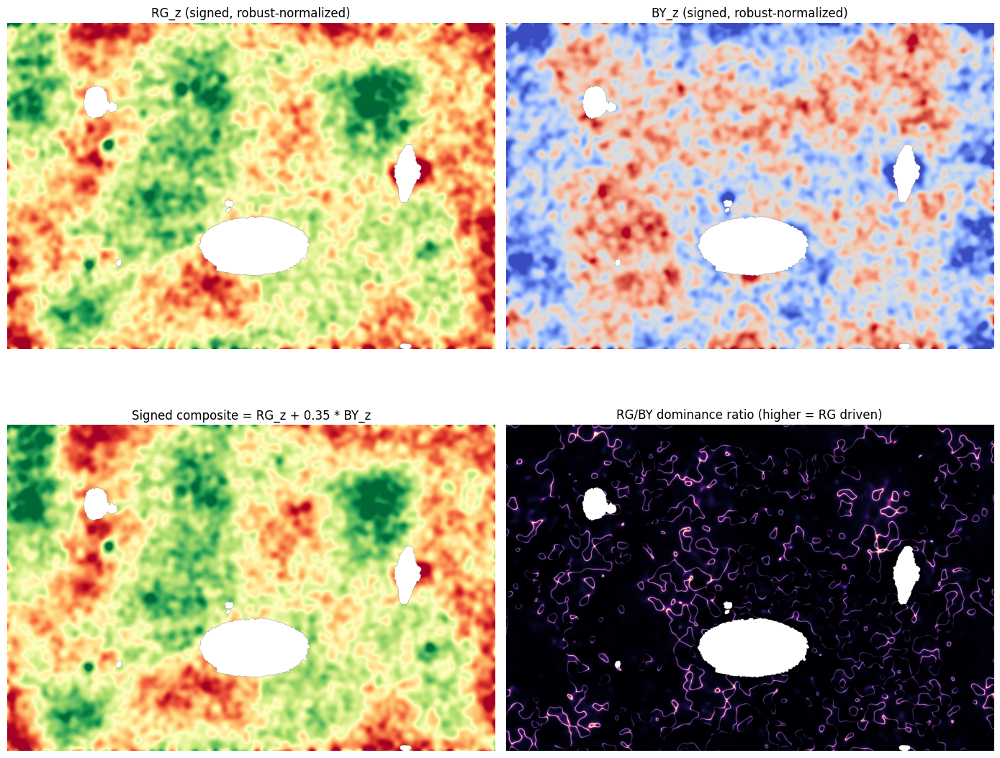

In [17]:
# Step 5: Signed composite map (RG and BY are kept separate + a mixed signed view)
def robust_z(x, mask, eps=1e-6):
    vals = x[mask]
    med = np.median(vals)
    mad = np.median(np.abs(vals - med)) + eps
    z = (x - med) / (1.4826 * mad + eps)
    return z, med, mad

RG_z, rg_med, rg_mad = robust_z(RG_map, background_mask)
BY_z, by_med, by_mad = robust_z(BY_map, background_mask)

beta = 0.35  # BY contribution into mixed map; keep RG dominant
signed_composite = RG_z + beta * BY_z
dominance_ratio = np.abs(RG_z) / (np.abs(BY_z) + 1e-3)

rg_dom = np.mean(np.abs(RG_z[background_mask]) > np.abs(BY_z[background_mask])) * 100
print(f'RG robust center={rg_med:.4f}, mad={rg_mad:.4f}')
print(f'BY robust center={by_med:.4f}, mad={by_mad:.4f}')
print(f'RG dominant pixels: {rg_dom:.2f}% of background')

rgz_lim = np.percentile(np.abs(RG_z[background_mask]), 98)
byz_lim = np.percentile(np.abs(BY_z[background_mask]), 98)
mix_lim = np.percentile(np.abs(signed_composite[background_mask]), 98)
dom_lim = np.percentile(dominance_ratio[background_mask], 99)

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
axes[0, 0].imshow(np.where(background_mask, RG_z, np.nan), cmap='RdYlGn_r', vmin=-rgz_lim, vmax=rgz_lim)
axes[0, 0].set_title('RG_z (signed, robust-normalized)')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, BY_z, np.nan), cmap='coolwarm', vmin=-byz_lim, vmax=byz_lim)
axes[0, 1].set_title('BY_z (signed, robust-normalized)')
axes[0, 1].axis('off')

axes[1, 0].imshow(np.where(background_mask, signed_composite, np.nan), cmap='RdYlGn_r', vmin=-mix_lim, vmax=mix_lim)
axes[1, 0].set_title(f'Signed composite = RG_z + {beta:.2f} * BY_z')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.where(background_mask, np.clip(dominance_ratio, 0, dom_lim), np.nan), cmap='magma')
axes[1, 1].set_title('RG/BY dominance ratio (higher = RG driven)')
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()


/var/folders/6v/mtnpf5g166lbvp24vscc7x0c0000gn/T/ipykernel_63677/150784853.py:8: FutureWarning: `binary_dilation` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.dilation` instead. Note the lack of mirroring for non-symmetric footprints (see docstring notes).
  edge_ring = morphology.binary_dilation(~background_mask, morphology.disk(6)) & background_mask


Mean |a_leak| over background: 0.00509
Mean |b_leak| over background: 0.00386
Mean |a_leak| near mask edge: 0.55095
Mean |b_leak| near mask edge: 0.39902


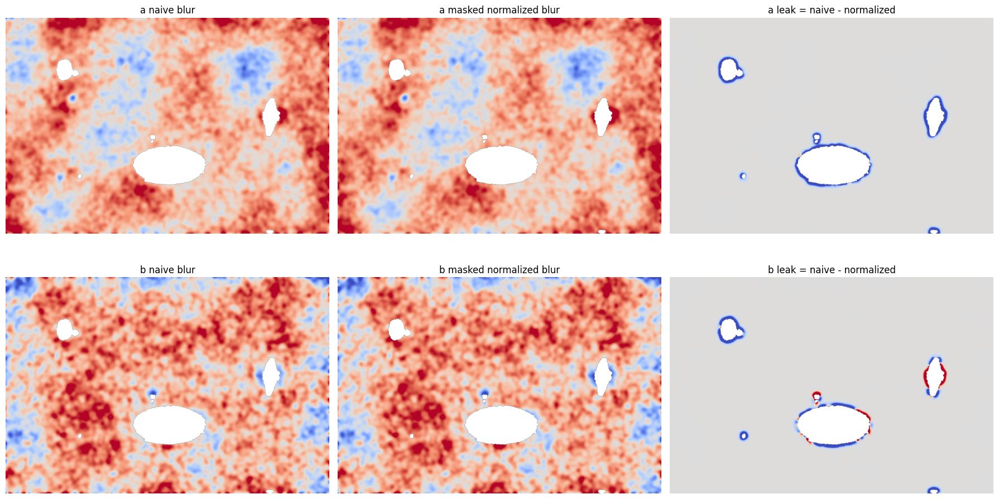

In [18]:
# Step 6: Debug halo/leak check - naive blur vs masked normalized blur
a_naive = filters.gaussian(np.where(background_mask, a, 0.0), sigma=target_sigma, preserve_range=True)
b_naive = filters.gaussian(np.where(background_mask, b, 0.0), sigma=target_sigma, preserve_range=True)

a_leak = a_naive - a_s
b_leak = b_naive - b_s

edge_ring = morphology.binary_dilation(~background_mask, morphology.disk(6)) & background_mask
a_leak_bg = np.mean(np.abs(a_leak[background_mask]))
b_leak_bg = np.mean(np.abs(b_leak[background_mask]))
a_leak_edge = np.mean(np.abs(a_leak[edge_ring])) if np.any(edge_ring) else np.nan
b_leak_edge = np.mean(np.abs(b_leak[edge_ring])) if np.any(edge_ring) else np.nan

print(f'Mean |a_leak| over background: {a_leak_bg:.5f}')
print(f'Mean |b_leak| over background: {b_leak_bg:.5f}')
print(f'Mean |a_leak| near mask edge: {a_leak_edge:.5f}')
print(f'Mean |b_leak| near mask edge: {b_leak_edge:.5f}')

a_lim = np.percentile(np.abs(a_s[background_mask]), 98)
b_lim = np.percentile(np.abs(b_s[background_mask]), 98)
a_leak_lim = np.percentile(np.abs(a_leak[background_mask]), 99)
b_leak_lim = np.percentile(np.abs(b_leak[background_mask]), 99)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[0, 0].imshow(np.where(background_mask, a_naive, np.nan), cmap='coolwarm', vmin=-a_lim, vmax=a_lim)
axes[0, 0].set_title('a naive blur')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, a_s, np.nan), cmap='coolwarm', vmin=-a_lim, vmax=a_lim)
axes[0, 1].set_title('a masked normalized blur')
axes[0, 1].axis('off')

axes[0, 2].imshow(np.where(background_mask, a_leak, np.nan), cmap='coolwarm', vmin=-a_leak_lim, vmax=a_leak_lim)
axes[0, 2].set_title('a leak = naive - normalized')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.where(background_mask, b_naive, np.nan), cmap='coolwarm', vmin=-b_lim, vmax=b_lim)
axes[1, 0].set_title('b naive blur')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.where(background_mask, b_s, np.nan), cmap='coolwarm', vmin=-b_lim, vmax=b_lim)
axes[1, 1].set_title('b masked normalized blur')
axes[1, 1].axis('off')

axes[1, 2].imshow(np.where(background_mask, b_leak, np.nan), cmap='coolwarm', vmin=-b_leak_lim, vmax=b_leak_lim)
axes[1, 2].set_title('b leak = naive - normalized')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


RG axis sign convention: rg_sign=+1
RG corr(32,64)=0.9676, RG sign agreement=98.96%
BY corr(32,64)=0.9390


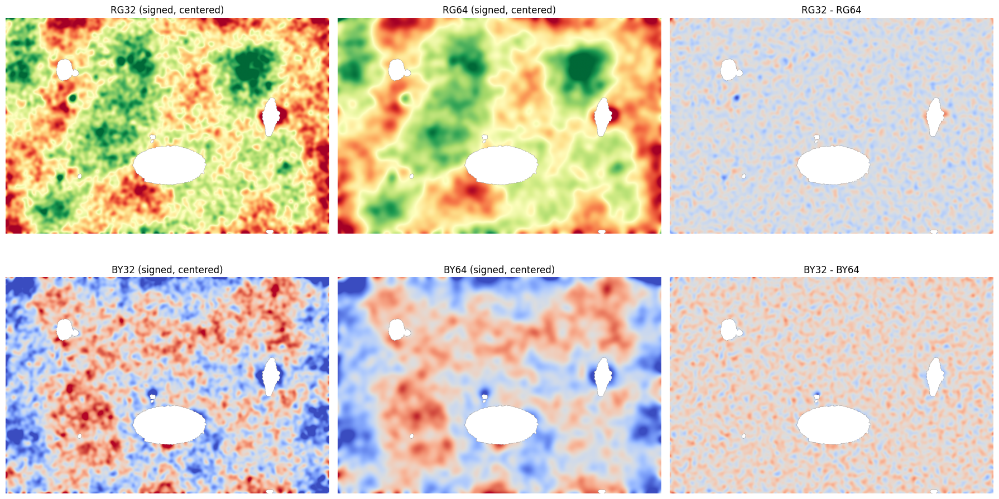

In [19]:
# Step 7: Check RG/BY field stability between sigma 32 and 64 (masked normalized blur only)
from scipy import ndimage as ndi


def masked_normalized_blur(x, mask, sigma, eps=1e-6):
    mask_f = mask.astype(np.float32)
    x_masked = np.where(mask, x, 0.0)
    num = filters.gaussian(x_masked, sigma=sigma, preserve_range=True)
    den = filters.gaussian(mask_f, sigma=sigma, preserve_range=True)
    y = num / (den + eps)
    return y, den


def robust_center(x, mask):
    return float(np.median(x[mask]))


def masked_corr(x, y, mask):
    xv = x[mask].astype(np.float64)
    yv = y[mask].astype(np.float64)
    xv -= xv.mean()
    yv -= yv.mean()
    denom = np.linalg.norm(xv) * np.linalg.norm(yv) + 1e-12
    return float(np.dot(xv, yv) / denom)


sigma32, sigma64 = 32, 64

# Physical low-frequency estimates in Lab units
rg_sign = 1.0  # +1 means +RG_map is red/magenta-ish, -RG_map is green-ish

a32, den32 = masked_normalized_blur(a, background_mask, sigma32)
b32, _ = masked_normalized_blur(b, background_mask, sigma32)
a64, den64 = masked_normalized_blur(a, background_mask, sigma64)
b64, _ = masked_normalized_blur(b, background_mask, sigma64)

RG32 = rg_sign * (a32 - robust_center(a32, background_mask))
RG64 = rg_sign * (a64 - robust_center(a64, background_mask))
BY32 = b32 - robust_center(b32, background_mask)
BY64 = b64 - robust_center(b64, background_mask)

rg_corr = masked_corr(RG32, RG64, background_mask)
by_corr = masked_corr(BY32, BY64, background_mask)

thr = np.percentile(np.abs(RG32[background_mask]), 25)
valid_rg = background_mask & (np.abs(RG32) >= thr)
rg_sign_agree = (
    np.mean(np.sign(RG32[valid_rg]) == np.sign(RG64[valid_rg])) * 100
    if np.any(valid_rg)
    else np.nan
)

print(f'RG axis sign convention: rg_sign={rg_sign:+.0f}')
print(f'RG corr(32,64)={rg_corr:.4f}, RG sign agreement={rg_sign_agree:.2f}%')
print(f'BY corr(32,64)={by_corr:.4f}')

rg_lim = np.percentile(np.abs(np.concatenate([RG32[background_mask], RG64[background_mask]])), 98)
by_lim = np.percentile(np.abs(np.concatenate([BY32[background_mask], BY64[background_mask]])), 98)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[0, 0].imshow(np.where(background_mask, RG32, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 0].set_title('RG32 (signed, centered)')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, RG64, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 1].set_title('RG64 (signed, centered)')
axes[0, 1].axis('off')

axes[0, 2].imshow(np.where(background_mask, RG32 - RG64, np.nan), cmap='coolwarm')
axes[0, 2].set_title('RG32 - RG64')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.where(background_mask, BY32, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[1, 0].set_title('BY32 (signed, centered)')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.where(background_mask, BY64, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[1, 1].set_title('BY64 (signed, centered)')
axes[1, 1].axis('off')

axes[1, 2].imshow(np.where(background_mask, BY32 - BY64, np.nan), cmap='coolwarm')
axes[1, 2].set_title('BY32 - BY64')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


field blend: w32=0.85, w64=0.15
correction strength k=0.80
apply_alpha coverage (>0.5): 94.97% of frame


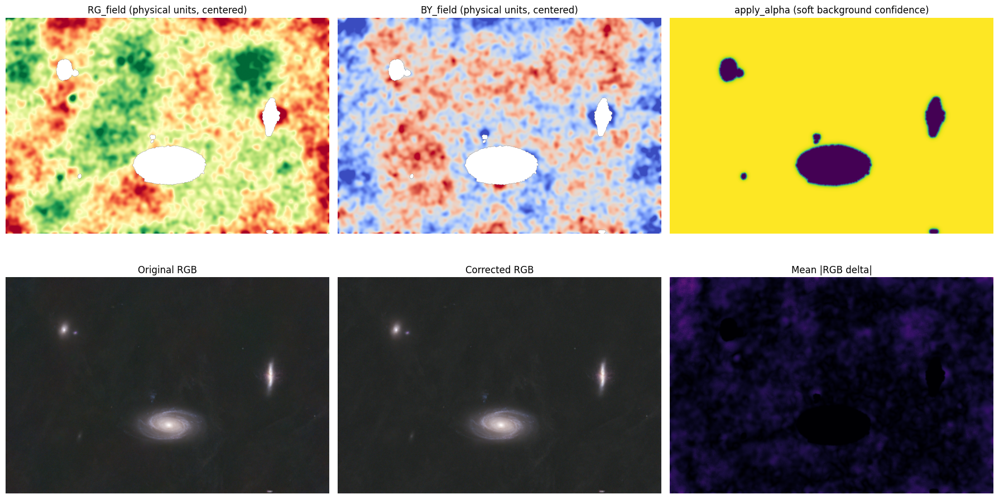

In [20]:
# Step 8: Build blended physical fields and apply soft background-only correction
# If 64 looks too plastic, keep its weight low
w32 = 0.85
w64 = 0.15

RG_field = w32 * RG32 + w64 * RG64
BY_field = w32 * BY32 + w64 * BY64

# Soft confidence mask: only confident background gets full correction
edge_soft_px = 28.0
bg_dist = ndi.distance_transform_edt(background_mask)
edge_falloff = np.clip(bg_dist / edge_soft_px, 0.0, 1.0)

support_mix = w32 * den32 + w64 * den64
support_conf = np.clip((support_mix - 0.15) / 0.85, 0.0, 1.0)

apply_alpha = np.where(background_mask, edge_falloff * support_conf, 0.0)

# Suppression coefficient in [0, 1]
k = 0.80
a_corr = a - k * RG_field * apply_alpha
b_corr = b - k * BY_field * apply_alpha

lab_corr = lab.copy()
lab_corr[..., 1] = a_corr
lab_corr[..., 2] = b_corr
rgb_corr = np.clip(color.lab2rgb(lab_corr), 0.0, 1.0)

print(f'field blend: w32={w32:.2f}, w64={w64:.2f}')
print(f'correction strength k={k:.2f}')
print(f'apply_alpha coverage (>0.5): {(apply_alpha > 0.5).mean() * 100:.2f}% of frame')

rg_lim = np.percentile(np.abs(RG_field[background_mask]), 98)
by_lim = np.percentile(np.abs(BY_field[background_mask]), 98)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[0, 0].imshow(np.where(background_mask, RG_field, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 0].set_title('RG_field (physical units, centered)')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, BY_field, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[0, 1].set_title('BY_field (physical units, centered)')
axes[0, 1].axis('off')

axes[0, 2].imshow(apply_alpha, cmap='viridis', vmin=0, vmax=1)
axes[0, 2].set_title('apply_alpha (soft background confidence)')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.clip(rgb_float, 0, 1))
axes[1, 0].set_title('Original RGB')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.clip(rgb_corr, 0, 1))
axes[1, 1].set_title('Corrected RGB')
axes[1, 1].axis('off')

delta = np.mean(np.abs(rgb_corr - rgb_float), axis=2)
axes[1, 2].imshow(delta, cmap='magma')
axes[1, 2].set_title('Mean |RGB delta|')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


Low-frequency robust sigma (lower is better if blotches are suppressed):
  RG32: 0.8317 -> 0.2312  (72.21% reduction)
  BY32: 0.7454 -> 0.2563  (65.61% reduction)
  RG64: 0.7716 -> 0.1695  (78.03% reduction)
  BY64: 0.6357 -> 0.1487  (76.60% reduction)


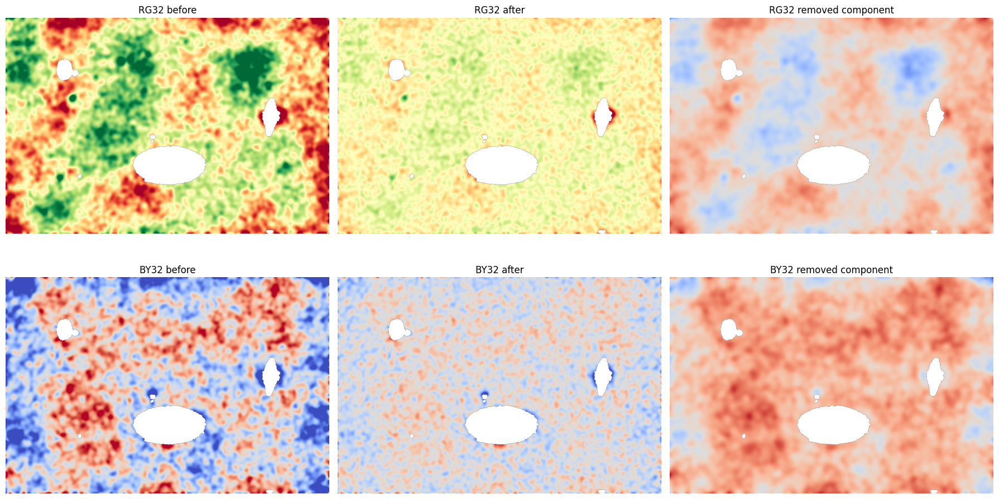

In [21]:
# Step 9: Validate correction effect on low-frequency chroma fields
a32_corr, _ = masked_normalized_blur(a_corr, background_mask, sigma32)
b32_corr, _ = masked_normalized_blur(b_corr, background_mask, sigma32)
a64_corr, _ = masked_normalized_blur(a_corr, background_mask, sigma64)
b64_corr, _ = masked_normalized_blur(b_corr, background_mask, sigma64)

RG32_corr = rg_sign * (a32_corr - robust_center(a32_corr, background_mask))
RG64_corr = rg_sign * (a64_corr - robust_center(a64_corr, background_mask))
BY32_corr = b32_corr - robust_center(b32_corr, background_mask)
BY64_corr = b64_corr - robust_center(b64_corr, background_mask)


def robust_sigma(x, mask, eps=1e-6):
    vals = x[mask]
    med = np.median(vals)
    mad = np.median(np.abs(vals - med)) + eps
    return float(1.4826 * mad)


rg32_before = robust_sigma(RG32, background_mask)
rg32_after = robust_sigma(RG32_corr, background_mask)
by32_before = robust_sigma(BY32, background_mask)
by32_after = robust_sigma(BY32_corr, background_mask)

rg64_before = robust_sigma(RG64, background_mask)
rg64_after = robust_sigma(RG64_corr, background_mask)
by64_before = robust_sigma(BY64, background_mask)
by64_after = robust_sigma(BY64_corr, background_mask)

print('Low-frequency robust sigma (lower is better if blotches are suppressed):')
print(f'  RG32: {rg32_before:.4f} -> {rg32_after:.4f}  ({(1 - rg32_after / (rg32_before + 1e-9)) * 100:.2f}% reduction)')
print(f'  BY32: {by32_before:.4f} -> {by32_after:.4f}  ({(1 - by32_after / (by32_before + 1e-9)) * 100:.2f}% reduction)')
print(f'  RG64: {rg64_before:.4f} -> {rg64_after:.4f}  ({(1 - rg64_after / (rg64_before + 1e-9)) * 100:.2f}% reduction)')
print(f'  BY64: {by64_before:.4f} -> {by64_after:.4f}  ({(1 - by64_after / (by64_before + 1e-9)) * 100:.2f}% reduction)')

rg_lim = np.percentile(np.abs(np.concatenate([RG32[background_mask], RG32_corr[background_mask]])), 98)
by_lim = np.percentile(np.abs(np.concatenate([BY32[background_mask], BY32_corr[background_mask]])), 98)

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes[0, 0].imshow(np.where(background_mask, RG32, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 0].set_title('RG32 before')
axes[0, 0].axis('off')

axes[0, 1].imshow(np.where(background_mask, RG32_corr, np.nan), cmap='RdYlGn_r', vmin=-rg_lim, vmax=rg_lim)
axes[0, 1].set_title('RG32 after')
axes[0, 1].axis('off')

axes[0, 2].imshow(np.where(background_mask, RG32 - RG32_corr, np.nan), cmap='coolwarm')
axes[0, 2].set_title('RG32 removed component')
axes[0, 2].axis('off')

axes[1, 0].imshow(np.where(background_mask, BY32, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[1, 0].set_title('BY32 before')
axes[1, 0].axis('off')

axes[1, 1].imshow(np.where(background_mask, BY32_corr, np.nan), cmap='coolwarm', vmin=-by_lim, vmax=by_lim)
axes[1, 1].set_title('BY32 after')
axes[1, 1].axis('off')

axes[1, 2].imshow(np.where(background_mask, BY32 - BY32_corr, np.nan), cmap='coolwarm')
axes[1, 2].set_title('BY32 removed component')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


In [22]:
# Step 10: Save corrected TIFF
from tifffile import imwrite

if 'rgb_corr' not in globals():
    raise RuntimeError('rgb_corr not found. Run Step 8 first.')

src_path = Path(img_path)
out_path = src_path.with_name(f'{src_path.stem}_corrected.tiff')

if np.issubdtype(rgb.dtype, np.integer):
    max_val = np.iinfo(rgb.dtype).max
    out = np.round(np.clip(rgb_corr, 0.0, 1.0) * max_val).astype(rgb.dtype)
else:
    out = np.clip(rgb_corr, 0.0, 1.0).astype(np.float32)

imwrite(out_path, out)
print(f'Saved: {out_path}')
print(f'shape={out.shape}, dtype={out.dtype}')


Saved: test_corrected.tiff
shape=(3850, 5762, 3), dtype=uint16
